# Detect Ads in radio stream using the trained models:

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib notebook
import librosa
import librosa.display
import IPython.display as ipd
from sklearn.cluster import MiniBatchKMeans
import joblib
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.callbacks import ModelCheckpoint
from DataGenerator import DataGenerator_Sup

Using TensorFlow backend.


Get a list of all files:

In [2]:
Radio_stream_folder = '../Data/radio_streams/' # audio files location

example_files = []
for r,d,f in os.walk(Radio_stream_folder):
    for filename in f:
        if '.mp3' in filename:
            example_files.append(os.path.join(r,filename))

How many mp3 files do we have?

In [3]:
n_files = len(example_files)

print('We have ' + str(n_files) + ' radio streaming examples')

We have 7 radio streaming examples


### Define utility functions:

In [4]:
def create_model(n_features):
    '''Create a model obejct with an input of length n_features'''
    model = Sequential() # create a model instance

    #add model layers
    model.add(Dense(256, activation = 'relu', input_shape=(n_features,)))
    model.add(Dense(64, activation = 'relu'))
    model.add(Dense(1, activation = 'sigmoid'))
    
    return model

In [5]:
def audio2features_vectors(file_path, clip_duration = 3, sr = 22050, n_mfcc = 13):
    '''Takes a path to an audio file, cuts it to clip_duration windows,
       extracts features, normalizes and outputs a np.array of shape (n_clips, n_features)'''
    features_vec = []
    # load audio
    audio = librosa.core.load(file_path, sr = sr)[0]
    audio_length = len(audio)/sr # in sec
    n_clips = int(np.floor(audio_length/clip_duration)) # full clips in audio
    # cut audio to clips and extract features
    for i in range(n_clips):
        clip = audio[i*clip_duration*sr:(i+1)*clip_duration*sr]
        features = librosa.feature.mfcc(clip, sr=sr, n_mfcc=n_mfcc, dct_type=2)
        features_vec.append(features.flatten())
    
    X = np.vstack(features_vec)
    mu = np.mean(X, axis=0) 
    std = np.std(X, axis=0)
    X = (X-mu)/std
    
    return X

### Choose audio file and load it:

In [6]:
n = 2 # file number to load
d = 3 # duration in sec of a sigle clip


Listen to the audio:

In [7]:
ipd.Audio(example_files[n], rate = 22050)

In [8]:
X = audio2features_vectors(example_files[n])
print(X.shape)
print('file lenght is ' + str(X.shape[0]*d/60.0) + ' minutes')

(294, 1690)
file lenght is 14.7 minutes


### Run model on file and extract start and end time:

In [9]:
# recreate a model for evaluation
num_features = 1690
eval_model = create_model(num_features)
# load weights
eval_model.load_weights('models/weights_1690_256_64_1.hdf5')
# compile
eval_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

Instructions for updating:
Colocations handled automatically by placer.


In [10]:
Ad_prob = eval_model.predict(X)
t = np.arange(len(Ad_prob))*d/60.0 # create time axis

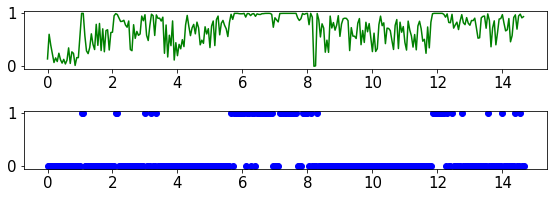

In [11]:
T = 0.97

plt.rcParams.update({'font.size': 15})
plt.figure(figsize= (8,3))
plt.subplot(2,1,1)
plt.plot(t, Ad_prob, 'g')

plt.subplot(2,1,2)
plt.plot(t, Ad_prob>T, 'bo')
plt.tight_layout()